In [82]:
# lib import 

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

netflix = pd.read_csv('netflix_titles.csv')
netflix.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [83]:
# 컬럼 확인 
list(netflix.columns)

['show_id',
 'type',
 'title',
 'director',
 'cast',
 'country',
 'date_added',
 'release_year',
 'rating',
 'duration',
 'listed_in',
 'description']

In [84]:
# 데이터 정보 확인 
netflix.info()

# 총 갯수는 8807 개이며 이보다 작은 수치의 컬럼에 차이만큼 결측치가 존재한다 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8807 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8807 non-null   object
 1   type          8807 non-null   object
 2   title         8807 non-null   object
 3   director      6173 non-null   object
 4   cast          7982 non-null   object
 5   country       7976 non-null   object
 6   date_added    8797 non-null   object
 7   release_year  8807 non-null   int64 
 8   rating        8803 non-null   object
 9   duration      8804 non-null   object
 10  listed_in     8807 non-null   object
 11  description   8807 non-null   object
dtypes: int64(1), object(11)
memory usage: 825.8+ KB


In [85]:
# 결측치 비율 계산 
for i in netflix.columns:
    missingValueRate = netflix[i].isna().sum() / len(netflix) * 100
    if missingValueRate > 0:
        print(f'{i} 결측치 비율: {round(missingValueRate,2)}%')
        
        # 5퍼 미만 = 이부분만 결측치 존재 하므로 행을 적절한 값으로 대체하는게 적절 
        # 5~ 20 미만 결측치가 꽤 많으므로 대체 하는 방법이 적절 

director 결측치 비율: 29.91%
cast 결측치 비율: 9.37%
country 결측치 비율: 9.44%
date_added 결측치 비율: 0.11%
rating 결측치 비율: 0.05%
duration 결측치 비율: 0.03%


In [86]:
# country 컬럼의 결측치는 9.44 % 이므로 fillna() 함수를 이용해 없는 데이터를 대체

netflix['country'] = netflix['country'].fillna('No Data')

In [87]:
# replace(0 함수를 이용하여 결측치를 문자열 ('No Data')로 바꿔줌 

netflix['director'] = netflix['director'].replace(np.nan, 'No Data')
netflix['cast'] = netflix['cast'].replace(np.nan, 'No Data')

In [88]:
# dropna(axis=0) : 결측치가 있는 로우 제거 
# 원본 객체를 수정하려면 inplace = True 옵션 추가 

netflix.dropna(axis=0, inplace=True) # 기존에 있는 결측치인 nan 을 거의다 제거한후 나머지 nan 로우에 있는 결측치제거 


In [89]:
netflix.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8790 entries, 0 to 8806
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       8790 non-null   object
 1   type          8790 non-null   object
 2   title         8790 non-null   object
 3   director      8790 non-null   object
 4   cast          8790 non-null   object
 5   country       8790 non-null   object
 6   date_added    8790 non-null   object
 7   release_year  8790 non-null   int64 
 8   rating        8790 non-null   object
 9   duration      8790 non-null   object
 10  listed_in     8790 non-null   object
 11  description   8790 non-null   object
dtypes: int64(1), object(11)
memory usage: 892.7+ KB


In [90]:
# 데이터 프레임의 각 컬럼별 결측치 갯수 반환
# isna() == isnull(): 결측값은 True, 그 외에는 False
netflix.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

In [91]:
# 피쳐 엔지니어링 
# 데이터 프레임의 기존 변수를 조합하거나 변경하여 새로운 변수(칼럼) 을 만드는것 
# 예를 들어 소득과 나이를 곱하여 가구별 소득 변수를 만들거나, 날짜 데이터에서 요일 값을 추출하여 평일과 주말변수를 만듬 

# rating 변수를 이용해서 새로운 컬럼 age_group 생성 
netflix['age_group'] = netflix['rating']
# netflix.head()

#  시청등급 코드를 이해하기 쉽게 바꿈 
age_group_dic = {
    'G': 'All',
    'TV-G': 'All',
    'TV-Y': 'All',
    'PG': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-Y7-FV': 'Older Kids',
    'TV-PG': 'Older Kids',
    'PG-13': 'Teens',
    'TV-14': 'Young Adults',
    'NC-17': 'Adults',
    'NR': 'Adults',
    'UR': 'Adults',
    'R': 'Adults',
    'TV-MA': 'Adults'
}

# map 함수를 이용하여 rating 칼럼의 값을 딕셔너리 기반으로 변환하여 age_group 컬럼에 대체 
netflix['age_group'] = netflix['age_group'].map(age_group_dic)
netflix.head(3)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,age_group
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,No Data,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",Teens
1,s2,TV Show,Blood & Water,No Data,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",Adults
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",No Data,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,Adults


In [92]:
netflix.to_csv('netflix_prep.csv', index=False)

Text(0.0, 1.2, 'Netflix brand pallete')

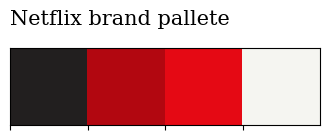

In [93]:
# 전처리된 데이터 저장 
netflix = pd.read_csv('netflix_prep.csv')

# palplot() 색상 시각화 
sns.palplot(['#221f1f', '#b20710', '#e50914', '#f5f5f1'])

plt.title('Netflix brand pallete' , loc='left', fontfamily='serif', fontsize=15, y=1.2)

In [94]:
# 오징어 게임 검색 
# str.contains(): 지정한 문자열이 포함되어 있는지를 확인 (True, False)
# na = False : 값이 NaN일 경우 False 로 처리 
# case = False : 대소문자를 구분하지 않고 검색 

netflix['title'].str.contains('squid game', na=False, case=False) 

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33       True
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [95]:
# 오징어 게임을 검색한 조건을 넷플 데이터에 넣어서 true 값만 출력 
netflix[netflix['title'].str.contains('squid game', na=False, case = False)]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,age_group
33,s34,TV Show,Squid Game,No Data,"Lee Jung-jae, Park Hae-soo, Wi Ha-jun, Oh Youn...",No Data,"September 17, 2021",2021,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Thrillers",Hundreds of cash-strapped players accept a str...,Adults


In [96]:
# 영화 드라마 구분한 파이 차트 그리기 
# 타입별 데이터 갯수 출력 
type_counts = netflix['type'].value_counts()
print(type_counts)

type
Movie      6126
TV Show    2664
Name: count, dtype: int64


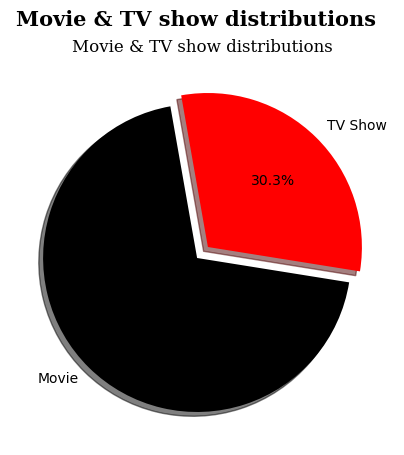

In [97]:
# 파이 차트  autopct 소수 0.1 까지 
plt.figure(figsize=(5 , 5))
plt.pie(type_counts, labels=type_counts.index , colors=['black', 'red'], autopct="%0.1f%%", startangle=100, shadow=True, explode=(0.05, 0.05))
plt.suptitle('Movie & TV show distributions', fontfamily= 'serif', fontsize=15, fontweight='bold')
plt.title('Movie & TV show distributions', fontfamily= 'serif', fontsize=12)
plt.show()

In [98]:
# 막대 그래프 그리기 
# 장르별 등장 횟수 계산 

genres = netflix['listed_in'].str.split(', ', expand=True).stack().value_counts() # listed_in 에 콤마를 기준으로 분리된 문자열을 새로운 갯수로 환산
genres

International Movies            2752
Dramas                          2426
Comedies                        1674
International TV Shows          1349
Documentaries                    869
Action & Adventure               859
TV Dramas                        762
Independent Movies               756
Children & Family Movies         641
Romantic Movies                  616
Thrillers                        577
TV Comedies                      573
Crime TV Shows                   469
Kids' TV                         448
Docuseries                       394
Music & Musicals                 375
Romantic TV Shows                370
Horror Movies                    357
Stand-Up Comedy                  343
Reality TV                       255
British TV Shows                 252
Sci-Fi & Fantasy                 243
Sports Movies                    219
Anime Series                     174
Spanish-Language TV Shows        173
TV Action & Adventure            167
Korean TV Shows                  151
C

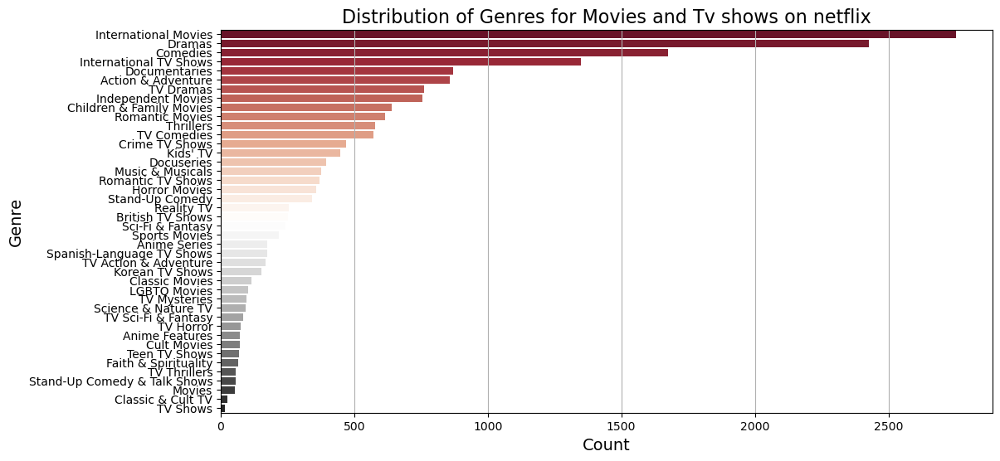

In [99]:
plt.figure(figsize=(12,6))
sns.barplot(x=genres.values,y=genres.index, hue=genres.index, palette='RdGy')
plt.title('Distribution of Genres for Movies and Tv shows on netflix', fontsize=16)
plt.xlabel('Count',fontsize=14)
plt.ylabel('Genre',fontsize=14)
plt.grid(axis='x')
plt.show()

In [100]:
# 히트맵 그리기
# 타이틀 컬럼에서 값이 Sankofa인 행을 확인하여 country와 age_group에 어떤 값이 있는지 확인
netflix[netflix['title'].str.contains('sankofa', na=False, case=False)]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,age_group
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...","United States, Ghana, Burkina Faso, United Kin...","September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults


In [101]:
# 출력할 최대 로우의 수를 None으로 설정하여 모두 출력
# 판다스는 기본 출랙 로우가 매우 짧으므로 기본값으로 column을 출력하면 앞에서 분리한 값이 보이지 않는다.
pd.set_option('display.max_rows', None)

# 쉼표로 country 컬럼의 값을 파이썬 리스트로 출력
netflix['country'] = netflix['country'].str.split(', ')
netflix['country']

0                                         [United States]
1                                          [South Africa]
2                                               [No Data]
3                                               [No Data]
4                                                 [India]
5                                               [No Data]
6                                               [No Data]
7       [United States, Ghana, Burkina Faso, United Ki...
8                                        [United Kingdom]
9                                         [United States]
10                                              [No Data]
11                                              [No Data]
12                              [Germany, Czech Republic]
13                                              [No Data]
14                                              [No Data]
15                                        [United States]
16                                              [No Data]
17            

In [102]:
# 파이썬 리스트로 바꾼 country 컬럼의 값에 explode 함수를 적용하여 개별 로우로 분리
# 분리한 각 로우에 하나의 국가만 포함되도록 변환

netflix_age_country = netflix.explode('country')
netflix_age_country

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,age_group
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,No Data,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",Teens
1,s2,TV Show,Blood & Water,No Data,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...",Adults
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",No Data,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,Adults
3,s4,TV Show,Jailbirds New Orleans,No Data,No Data,No Data,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",Adults
4,s5,TV Show,Kota Factory,No Data,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,Adults
5,s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, H...",No Data,"September 24, 2021",2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries",The arrival of a charismatic young priest brin...,Adults
6,s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, ...",No Data,"September 24, 2021",2021,PG,91 min,Children & Family Movies,Equestria's divided. But a bright-eyed hero be...,Older Kids
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",United States,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",Ghana,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",Burkina Faso,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults


In [103]:
netflix_age_country[netflix_age_country['title'].str.contains('sankofa',na=False, case=False)]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,age_group
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",United States,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",Ghana,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",Burkina Faso,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",United Kingdom,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",Germany,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults
7,s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra D...",Ethiopia,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model s...",Adults


In [104]:
netflix_age_country_unstack = netflix_age_country.groupby('age_group')['country'].value_counts().unstack()
# list(netflix_age_country_unstack.columns)
netflix_age_country_unstack

country,,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,...,United Kingdom,"United Kingdom,",United States,"United States,",Uruguay,Vatican City,Venezuela,Vietnam,West Germany,Zimbabwe
age_group,,,,,,,,,,,,,,,,,,,,,
Adults,1.0,1.0,1.0,2.0,1.0,71.0,1.0,68.0,7.0,NaN,...,408.0,2.0,1803.0,1.0,9.0,NaN,2.0,3.0,3.0,2.0
All,NaN,NaN,NaN,NaN,NaN,5.0,NaN,18.0,NaN,NaN,...,63.0,NaN,255.0,NaN,2.0,NaN,NaN,1.0,1.0,1.0
Older Kids,NaN,NaN,NaN,NaN,NaN,5.0,NaN,40.0,3.0,NaN,...,145.0,NaN,694.0,NaN,2.0,1.0,NaN,NaN,NaN,NaN
Teens,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,NaN,NaN,...,84.0,NaN,433.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Young Adults,1.0,NaN,NaN,1.0,NaN,10.0,NaN,21.0,2.0,1.0,...,103.0,NaN,495.0,NaN,1.0,NaN,2.0,3.0,1.0,NaN


In [105]:
# 나라별 그룹에 따른 컨탠츠 필터링 
age_order = ['All','Older Kids' ,'Teens' ,'Young Adults' ,'Adults']
country_order =country_order = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain', 'Mexico', 'Turkey']

netflix_age_country_unstack = netflix_age_country_unstack.loc[age_order, country_order]
# 결측치를 0으로 대체 
netflix_age_country_unstack = netflix_age_country_unstack.fillna(0)

netflix_age_country_unstack

country,United States,India,United Kingdom,Canada,Japan,France,South Korea,Spain,Mexico,Turkey
age_group,,,,,,,,,,
All,255.0,16.0,63.0,64.0,6.0,29.0,11.0,9.0,3.0,1.0
Older Kids,694.0,169.0,145.0,108.0,93.0,54.0,35.0,15.0,20.0,9.0
Teens,433.0,11.0,84.0,32.0,9.0,35.0,1.0,5.0,4.0,0.0
Young Adults,495.0,572.0,103.0,49.0,98.0,48.0,86.0,18.0,22.0,32.0
Adults,1803.0,278.0,408.0,192.0,110.0,227.0,98.0,185.0,120.0,71.0


In [106]:
# 나이 그룹에 따른 국가별 넷플릭스 콘텐츠 비율 
# df.div() : axis=1 을 전달하면 각 칼럼의 값을 칼럼의 합으로 나눈다 

netflix_age_country_unstack = netflix_age_country_unstack.div(netflix_age_country_unstack.sum(axis=0), axis=1)

netflix_age_country_unstack

country,United States,India,United Kingdom,Canada,Japan,France,South Korea,Spain,Mexico,Turkey
age_group,,,,,,,,,,
All,0.069293,0.015296,0.078456,0.143820,0.018987,0.073791,0.047619,0.038793,0.017751,0.008850
Older Kids,0.188587,0.161568,0.180573,0.242697,0.294304,0.137405,0.151515,0.064655,0.118343,0.079646
Teens,0.117663,0.010516,0.104608,0.071910,0.028481,0.089059,0.004329,0.021552,0.023669,0.000000
Young Adults,0.134511,0.546845,0.128269,0.110112,0.310127,0.122137,0.372294,0.077586,0.130178,0.283186
Adults,0.489946,0.265774,0.508095,0.431461,0.348101,0.577608,0.424242,0.797414,0.710059,0.628319


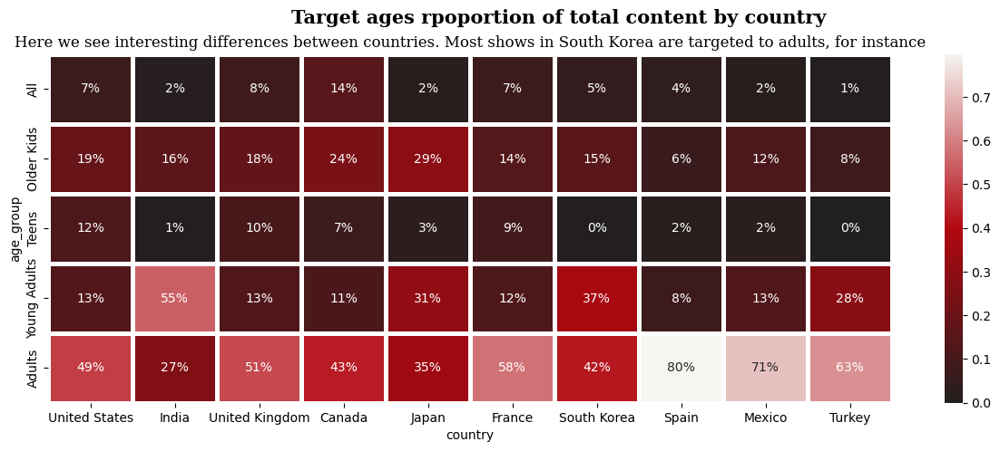

''

In [117]:
# 히드맵 시각화


plt.figure(figsize=(15, 5))


# 사용자 정의 컬러맵 만들기
cmap = plt.matplotlib.colors.LinearSegmentedColormap.from_list('', ['#221f1f', '#b20710', '#f5f5f1'])
sns.heatmap(netflix_age_country_unstack, cmap=cmap, linewidth=2.5, annot=True, fmt='.0%') # 데이터 시각화


plt.suptitle('Target ages rpoportion of total content by country', fontweight='bold', fontfamily='serif', fontsize=15)
plt.title('Here we see interesting differences between countries. Most shows in South Korea are targeted to adults, for instance', fontsize=12, fontfamily='serif')
plt.show()


# 미국과 캐나다는 모든 나이 그룹에서 골고루 이용자를 가지고 있다.
# 모든 국가에서 성인 이용자가 가장 많다.
# 청소년과 어린이의 비율은 국가마다 다르다.
# 인도와 일본은 Older Kids의 비율이 상대적으로 높다
""